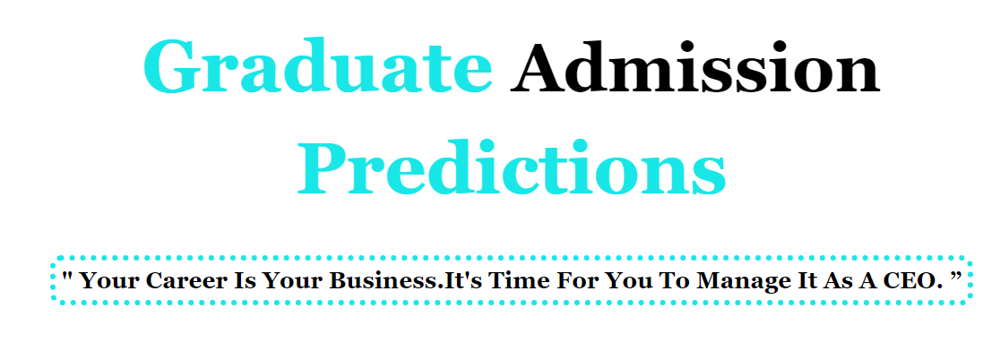

## About Dataset
- 1.Serial No.
- 2.GRE [Graduate Record Examinations] Scores ( out of 340 ).
- 3.TOEFL [Test of English as a Foreign Language] Scores ( out of 120 ).
- 4.University Rating ( out of 5 ).
- 5.SOP [Statement of Purpose].
- 6.LOR [Letter of Recommendation Strength] ( out of 5 ).
- 7.CGPA [Cumulative Grade Points Average] ( out of 10 ).
- 8.Research ( either 0 or 1 ).
- 9.Chance of Admit ( ranging from 0 to 1 ).

## Importing Basic Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("Admission_Predict.csv")
df.head()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65


,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65


let us drop the irrelevant column and check if there are any null values in the dataset

## Understanding Data

In [2]:
df = df.drop(['Serial No.'], axis=1)
df.isnull().sum()

GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

In [3]:
df.shape

(400, 8)

(400, 8)

In [4]:
df.ndim

2

2

In [5]:
df.columns

Index(['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR ', 'CGPA',
       'Research', 'Chance of Admit '],
      dtype='object')

Index(['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR ', 'CGPA',
       'Research', 'Chance of Admit '],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   GRE Score          400 non-null    int64  
 1   TOEFL Score        400 non-null    int64  
 2   University Rating  400 non-null    int64  
 3   SOP                400 non-null    float64
 4   LOR                400 non-null    float64
 5   CGPA               400 non-null    float64
 6   Research           400 non-null    int64  
 7   Chance of Admit    400 non-null    float64
dtypes: float64(4), int64(4)
memory usage: 25.1 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   GRE Score          400 non-null    int64  
 1   TOEFL Score        400 non-null    int64  
 2   University Rating  400 non-null    int64  
 3   SOP             

In [7]:
df.describe()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,316.807500,107.410000,3.087500,3.400000,3.452500,8.598925,0.547500,0.724350
std,11.473646,6.069514,1.143728,1.006869,0.898478,0.596317,0.498362,0.142609
min,290.000000,92.000000,1.000000,1.000000,1.000000,6.800000,0.000000,0.340000
25%,308.000000,103.000000,2.000000,2.500000,3.000000,8.170000,0.000000,0.640000
50%,317.000000,107.000000,3.000000,3.500000,3.500000,8.610000,1.000000,0.730000
75%,325.000000,112.000000,4.000000,4.000000,4.000000,9.062500,1.000000,0.830000
max,340.000000,120.000000,5.000000,5.000000,5.000000,9.920000,1.000000,0.970000


,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,316.807500,107.410000,3.087500,3.400000,3.452500,8.598925,0.547500,0.724350
std,11.473646,6.069514,1.143728,1.006869,0.898478,0.596317,0.498362,0.142609
min,290.000000,92.000000,1.000000,1.000000,1.000000,6.800000,0.000000,0.340000
25%,308.000000,103.000000,2.000000,2.500000,3.000000,8.170000,0.000000,0.640000
50%,317.000000,107.000000,3.000000,3.500000,3.500000,8.610000,1.000000,0.730000
75%,325.000000,112.000000,4.000000,4.000000,4.000000,9.062500,1.000000,0.830000
max,340.000000,120.000000,5.000000,5.000000,5.000000,9.920000,1.000000,0.970000


In [8]:
df=df.rename(columns = {'Chance of Admit ':'Chance of Admit'})

### Outlier Detection

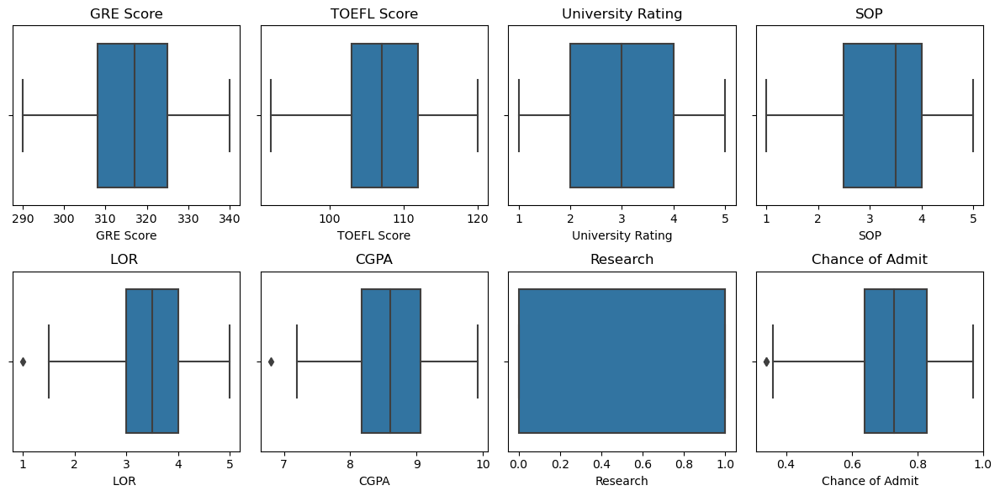

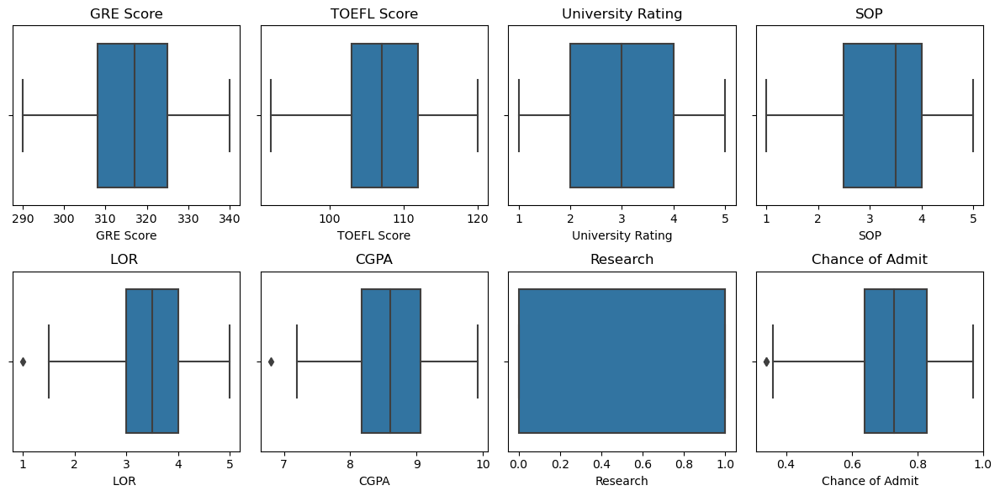

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create box plots for all columns
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 6))
fig.subplots_adjust(hspace=0.5)

# Iterate over each column
for i, column in enumerate(df.columns):
    # Calculate row and column indices for subplots
    row = i // 4
    col = i % 4

    # Create box plot for the current column
    sns.boxplot(x=df[column], ax=axes[row, col])
    axes[row, col].set_title(column)

# Show the plot
plt.tight_layout()
plt.show()

In [10]:
from collections import Counter

def detect_outliers(df, n, features):
    """
    Takes a dataframe df of features and returns a list of the indices
    corresponding to the observations containing more than n outliers according
    to the Tukey method.
    """
    outlier_indices = []

    # iterate over features(columns)
    for col in features:
        # 1st quartile (25%)
        Q1 = np.percentile(df[col], 25)
        # 3rd quartile (75%)
        Q3 = np.percentile(df[col], 75)
        # Interquartile range (IQR)
        IQR = Q3 - Q1

        # outlier step
        outlier_step = 1.5 * IQR

        # Determine a list of indices of outliers for feature col
        outlier_list_col = df[(df[col] < Q1 - outlier_step) | (df[col] > Q3 + outlier_step)].index

        # append the found outlier indices for col to the list of outlier indices
        outlier_indices.extend(outlier_list_col)

    # select observations containing more than 2 outliers
    outlier_indices = Counter(outlier_indices)
    multiple_outliers = list(k for k, v in outlier_indices.items() if v > n)

    return multiple_outliers

outliers_to_drop = detect_outliers(df, 2, ['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR ', 'CGPA', 'Research'])

In [11]:
df.loc[outliers_to_drop]

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit


,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit


There are no outliers because all the values are inside a fixed range and none of them go lower/beyond that range which therefore produces no outliers

In [12]:
cols = df.drop(columns=df.columns[0])  # Drop column by index
cols.head().T

,0,1,2,3,4
TOEFL Score,118.00,107.00,104.00,110.00,103.00
University Rating,4.00,4.00,3.00,3.00,2.00
SOP,4.50,4.00,3.00,3.50,2.00
LOR,4.50,4.50,3.50,2.50,3.00
CGPA,9.65,8.87,8.00,8.67,8.21
Research,1.00,1.00,1.00,1.00,0.00
Chance of Admit,0.92,0.76,0.72,0.80,0.65


,0,1,2,3,4
TOEFL Score,118.00,107.00,104.00,110.00,103.00
University Rating,4.00,4.00,3.00,3.00,2.00
SOP,4.50,4.00,3.00,3.50,2.00
LOR,4.50,4.50,3.50,2.50,3.00
CGPA,9.65,8.87,8.00,8.67,8.21
Research,1.00,1.00,1.00,1.00,0.00
Chance of Admit,0.92,0.76,0.72,0.80,0.65


### Data Analysis

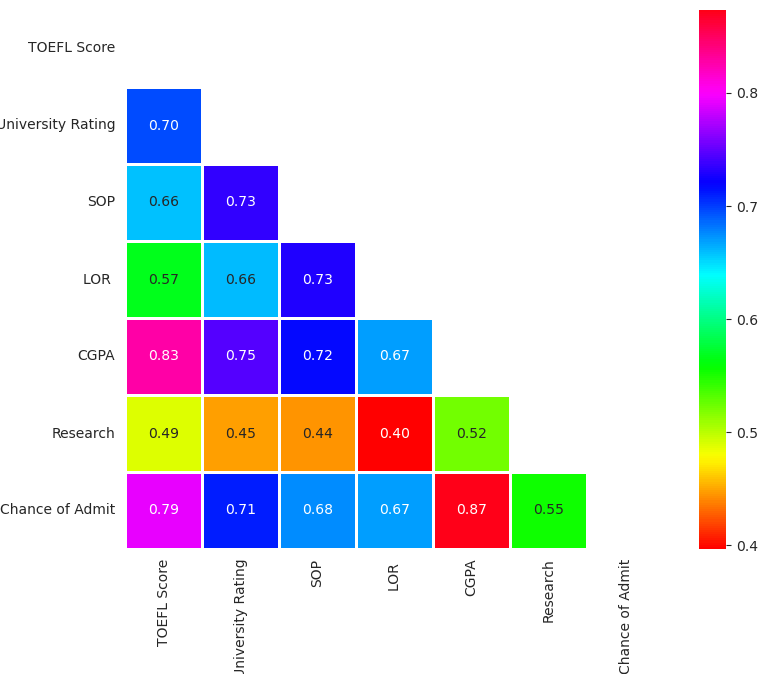

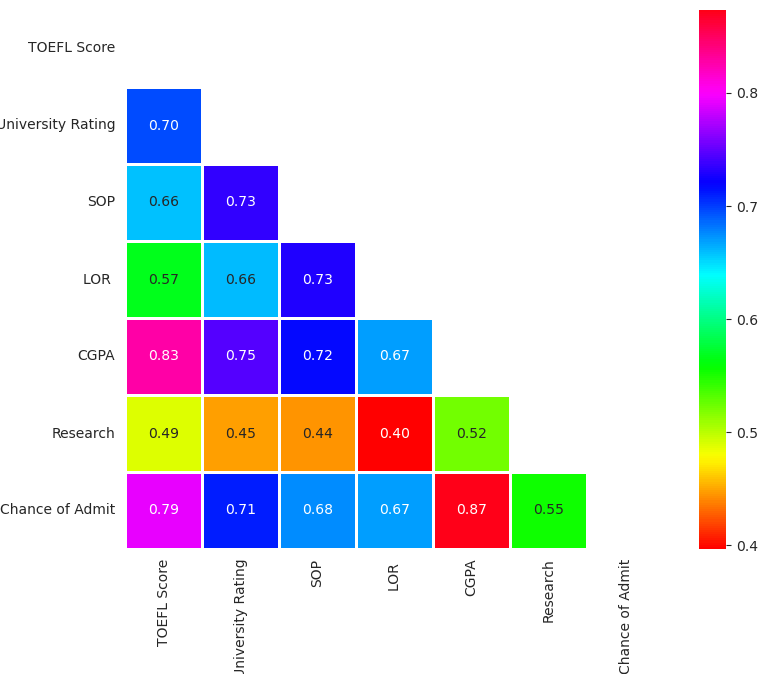

In [13]:
corr = cols.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(9, 7))
    ax = sns.heatmap(corr,mask=mask,square=True,annot=True,fmt='0.2f',linewidths=.8,cmap="hsv")

Here we can see that the chance of admit is highly correlated with CGPA, GRE and TOEFEL scores are also correlated.

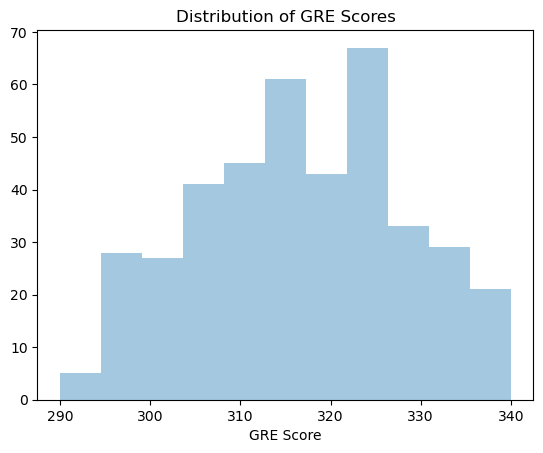

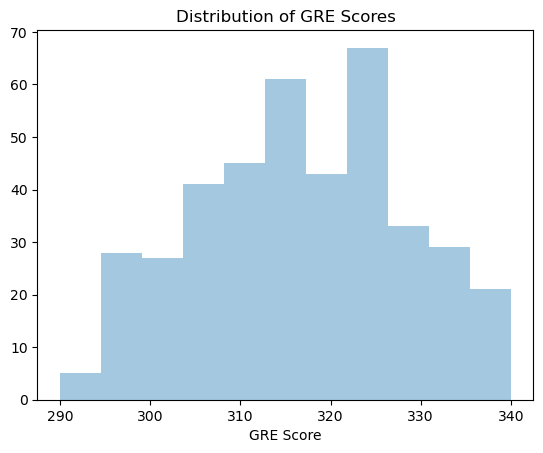

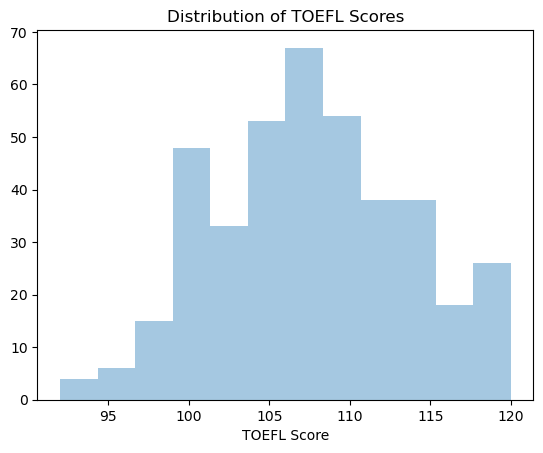

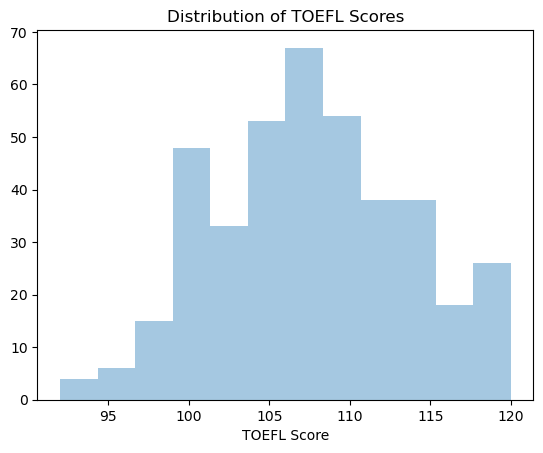

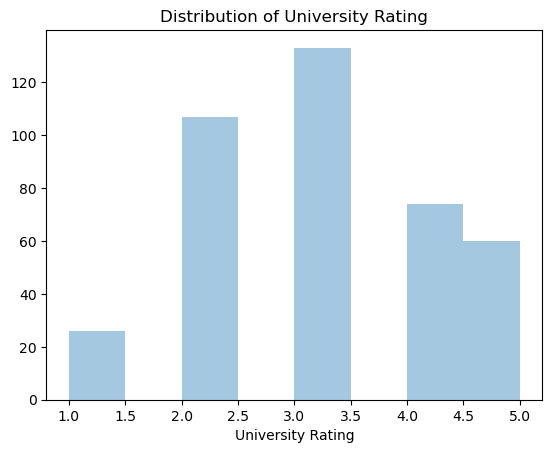

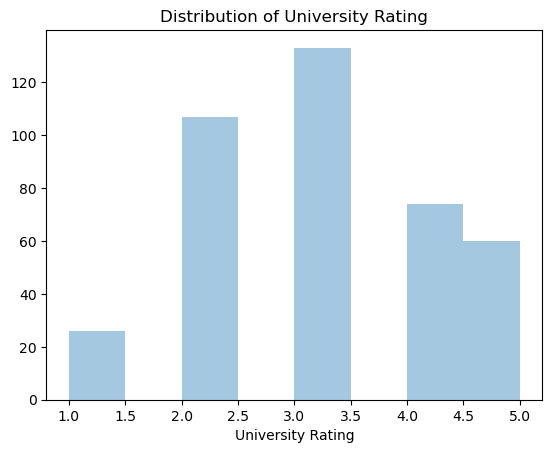

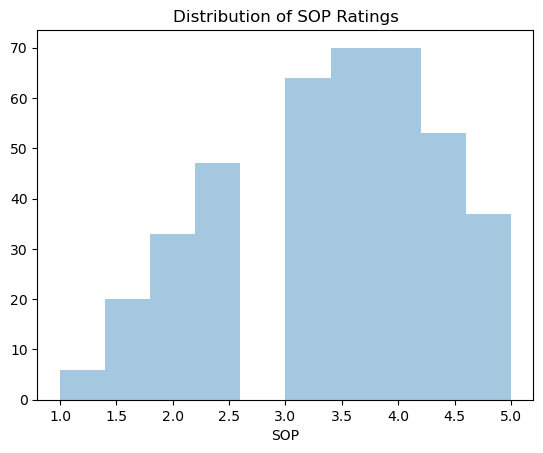

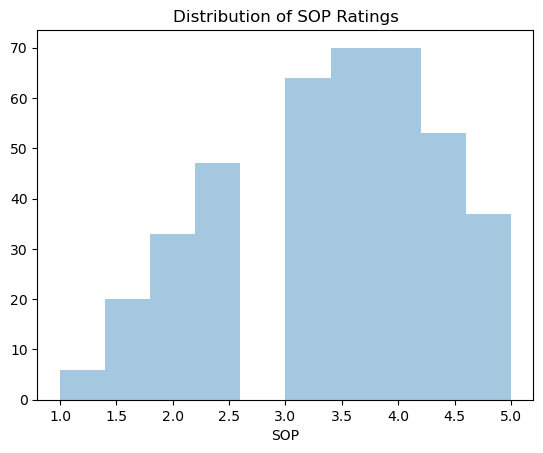

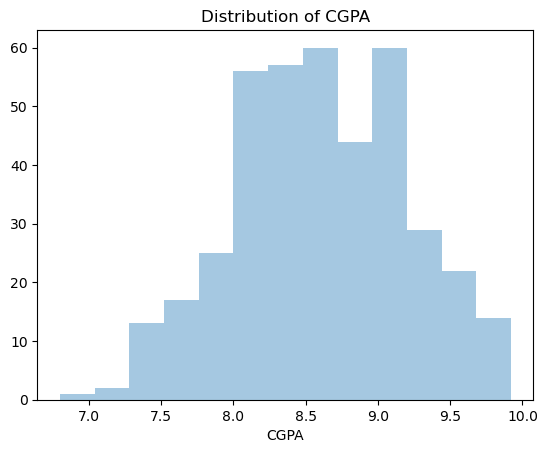

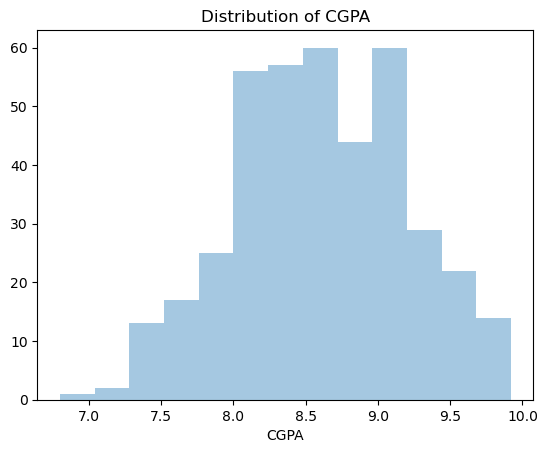

In [14]:
fig = sns.distplot(df['GRE Score'], kde=False)
plt.title("Distribution of GRE Scores")
plt.show()

fig = sns.distplot(df['TOEFL Score'], kde=False)
plt.title("Distribution of TOEFL Scores")
plt.show()

fig = sns.distplot(df['University Rating'], kde=False)
plt.title("Distribution of University Rating")
plt.show()

fig = sns.distplot(df['SOP'], kde=False)
plt.title("Distribution of SOP Ratings")
plt.show()

fig = sns.distplot(df['CGPA'], kde=False)
plt.title("Distribution of CGPA")
plt.show()

plt.show()

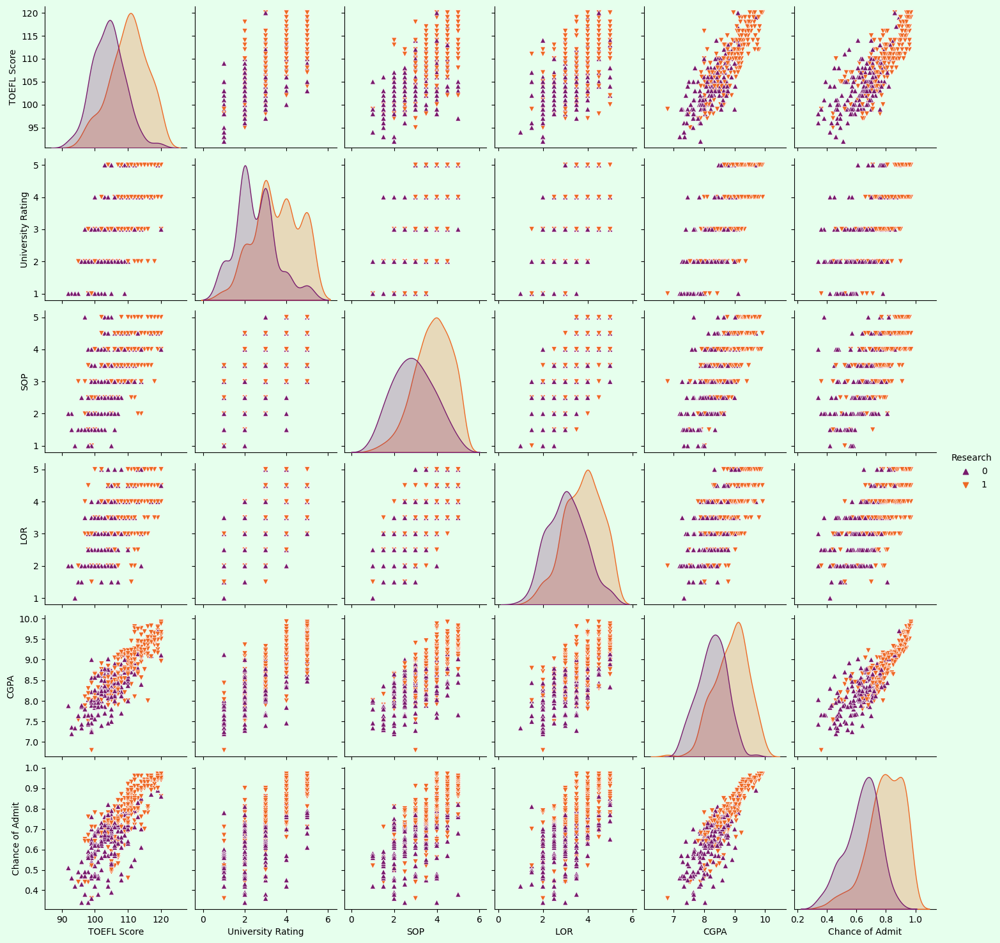

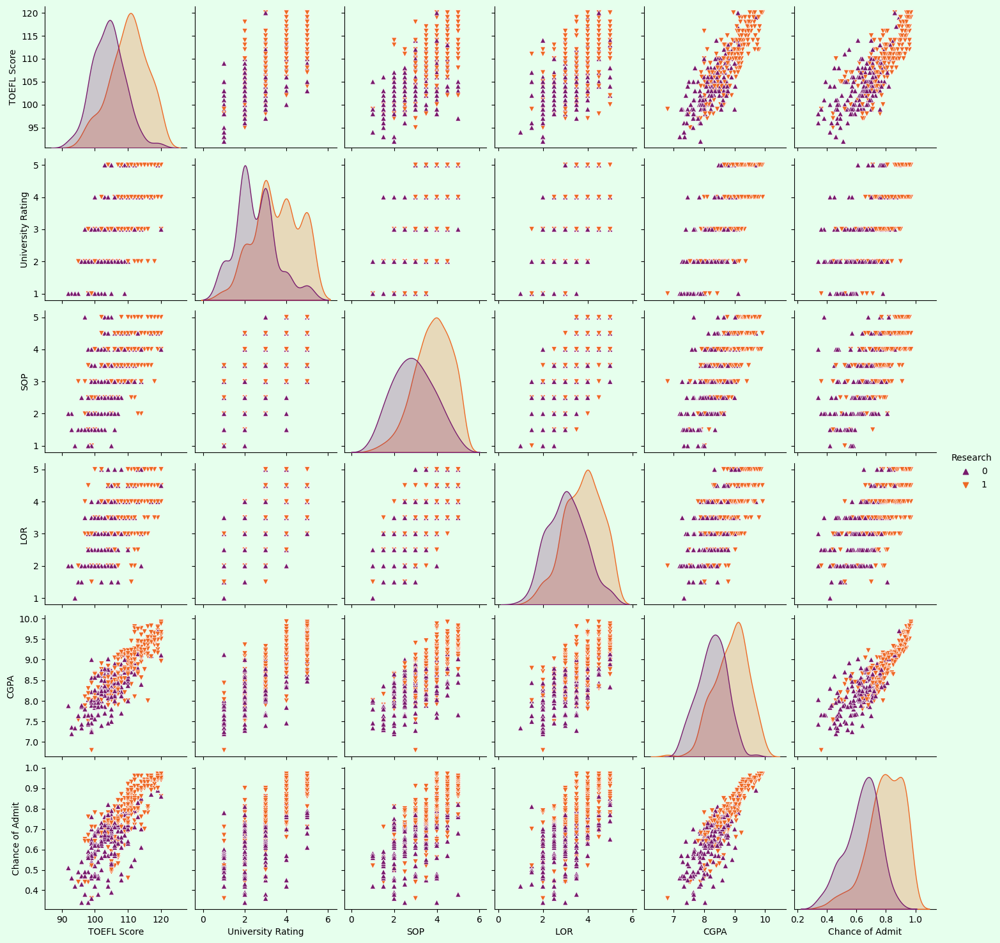

In [15]:
plt.rcParams['axes.facecolor'] = "#e6ffed"
plt.rcParams['figure.facecolor'] = "#e6ffed"
g = sns.pairplot(data=cols,hue='Research',markers=["^", "v"],palette='inferno')

Inferences from the above pairplot:

- GRE score TOEFL score and CGPA all are linearly related to each other
- Research Students tend to Score higher by all means

<Axes: xlabel='TOEFL Score', ylabel='Density'>

<Axes: xlabel='TOEFL Score', ylabel='Density'>

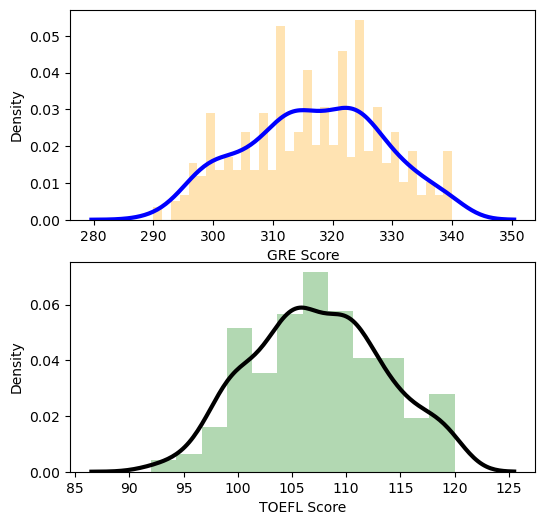

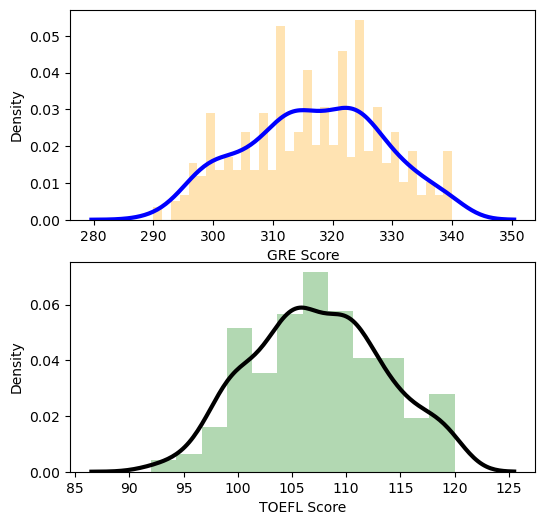

In [16]:
plt.rcParams['axes.facecolor'] = "white"
plt.rcParams['figure.facecolor'] = "white"
plt.figure(figsize=(6,6))
plt.subplot(2, 1, 1)
sns.distplot(df['GRE Score'],bins=34,color='orange',  kde_kws={"color": "b", "lw": 3, "label": "KDE"},hist_kws={"linewidth": 2,"alpha": 0.3 })
plt.subplot(2, 1, 2)
sns.distplot(df['TOEFL Score'],bins=12,color='green' ,kde_kws={"color": "k", "lw": 3, "label": "KDE"},hist_kws={"linewidth": 7,"alpha": 0.3 })

From the above 2 graphs its clear that people tend to score above 310 in GRE and above 100 in TOEFL

<Axes: xlabel='University Rating', ylabel='CGPA'>

<Axes: xlabel='University Rating', ylabel='CGPA'>

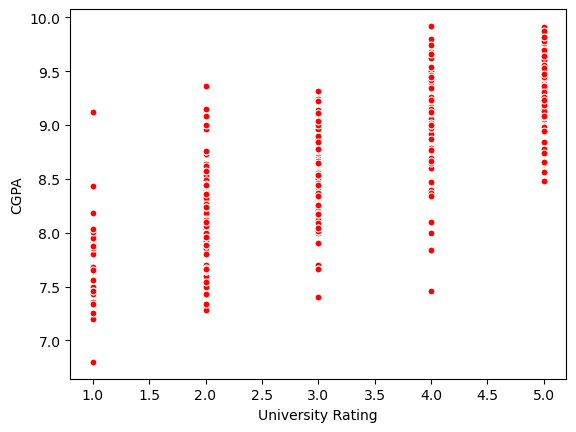

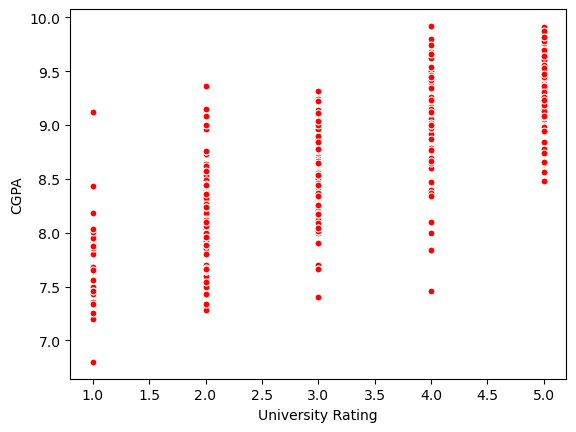

In [17]:
sns.scatterplot(x='University Rating',y='CGPA',data=df,color='Red', marker=".", s=100)

Ratings of university increase with the increase in the CGPA

## Bivariate Analysis

#### GREScore Vs ChanceOfAdmit :-

In [18]:
import plotly.express as px

fig = px.box(df, x="GRE Score", y="Chance of Admit")
fig.update_layout(title='GRE Score Vs Chance of Admit',
                  template='plotly_white')
fig.update_traces(marker_size=12, marker_color='#19e6e6')

fig.show()


In [19]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

# Sort the DataFrame by 'GRE Score' in ascending order
df_sorted = df.sort_values('GRE Score')

# Fit a straight line to the sorted data points
x = df_sorted['GRE Score']
y = df_sorted['Chance of Admit']
m, b = np.polyfit(x, y, 1)
line = m * x + b

# Create the scatter plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['GRE Score'], y=df['Chance of Admit'], mode='markers',
                         marker=dict(color='red', size=10, line=dict(color='black', width=1)),
                         name='Data'))
fig.add_trace(go.Scatter(x=x, y=line, mode='lines', line=dict(color='black', width=2), name='Trend Line'))

fig.update_layout(
    title='Scatter Plot of GRE Score vs Chance of Admit',
    xaxis_title='GRE Score',
    yaxis_title='Chance of Admit',
    template='plotly_white'
)

fig.show()

There is a strong positive relationship between GREScore and ChanceOfAdmit.

#### TOEFL Score vs Chance Of Admit :-

In [20]:
import plotly.express as px

fig = px.box(df, x="TOEFL Score", y="Chance of Admit")
fig.update_layout(title='TOEFL Vs Chance of Admit',
                  template='plotly_white')
fig.update_traces(marker_size=12, marker_color='orange')

fig.show()

In [21]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

# Sort the DataFrame by 'TOEFL Score' in ascending order
df_sorted_toefl = df.sort_values('TOEFL Score')

# Fit a straight line to the sorted data points for TOEFL Score
x_toefl = df_sorted_toefl['TOEFL Score']
y_toefl = df_sorted_toefl['Chance of Admit']
m_toefl, b_toefl = np.polyfit(x_toefl, y_toefl, 1)
line_toefl = m_toefl * x_toefl + b_toefl

# Create the scatter plot for TOEFL Score
fig_toefl = go.Figure()
fig_toefl.add_trace(go.Scatter(x=df['TOEFL Score'], y=df['Chance of Admit'], mode='markers',
                              marker=dict(color='blue', size=10, line=dict(color='black', width=1)),
                              name='Data'))
fig_toefl.add_trace(go.Scatter(x=x_toefl, y=line_toefl, mode='lines',
                              line=dict(color='black', width=2), name='Trend Line'))

fig_toefl.update_layout(
    title='Scatter Plot of TOEFL Score vs Chance of Admit',
    xaxis_title='TOEFL Score',
    yaxis_title='Chance of Admit',
    template='plotly_white'
)

fig_toefl.show()


#### University Rating vs Chance of Admit :-

In [22]:
import plotly.express as px

fig = px.box(df, x="University Rating", y="Chance of Admit", color="University Rating")
fig.update_layout(title='University Rating Vs Chance of Admit', template='plotly_white')
fig.update_traces(marker_size=12)

## Hypothesis Testing

In [23]:
df.head().style.background_gradient(cmap='Greys')

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337,118,4,4.500000,4.500000,9.650000,1,0.920000
1,324,107,4,4.000000,4.500000,8.870000,1,0.760000
2,316,104,3,3.000000,3.500000,8.000000,1,0.720000
3,322,110,3,3.500000,2.500000,8.670000,1,0.800000
4,314,103,2,2.000000,3.000000,8.210000,0,0.650000


,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337,118,4,4.500000,4.500000,9.650000,1,0.920000
1,324,107,4,4.000000,4.500000,8.870000,1,0.760000
2,316,104,3,3.000000,3.500000,8.000000,1,0.720000
3,322,110,3,3.500000,2.500000,8.670000,1,0.800000
4,314,103,2,2.000000,3.000000,8.210000,0,0.650000


### Q1) Does the GRE score affect the probability of getting Admission? (chi square test)

- a. H0: GREScore and Admission_categories are independent.
- b. H1: GREScore and Admission_categories dependent.

In [24]:
import pandas as pd
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['GRE Score'], df['Chance of Admit'])

# Perform chi-square test of independence
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Print the results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)

Chi-square statistic: 3533.202076644214
p-value: 2.5350227810312894e-18
Chi-square statistic: 3533.202076644214
p-value: 2.5350227810312894e-18


Since the p-value is extremely small (less than the typical significance level of 0.05), we reject the null hypothesis. This indicates that there is a statistically significant relationship between the GRE score and the probability of getting admission. In other words, the GRE score and admission categories are dependent variables.

### Q2) - Does the TOEFL score affect the probability of getting Admission? (chi square test)

- a.H0: TOEFLscore and Admission_categories are independent.
- b.H1: TOEFLscore and Admission_categories dependent.

In [25]:
import pandas as pd
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['TOEFL Score'], df['Chance of Admit'])

# Perform chi-square test of independence
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Print the results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)

Chi-square statistic: 2801.9531444069453
p-value: 1.3035001855114121e-62
Chi-square statistic: 2801.9531444069453
p-value: 1.3035001855114121e-62


Since the p-value is extremely small (less than the typical significance level of 0.05), we reject the null hypothesis. This suggests that there is a statistically significant relationship between the TOEFL score and the probability of getting admission. In other words, the TOEFL score and admission categories are dependent variables.

### Q3) - Does the UniversityRating affect the probability of getting Admission? (chi square test)

- a.H0: UniversityRating and Admission_categories are independent.
- b.H1: UniversityRating and Admission_categories dependent.

In [26]:
import pandas as pd
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['University Rating'], df['Chance of Admit'])

# Perform chi-square test of independence
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Print the results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)

Chi-square statistic: 581.4367885055965
p-value: 3.9091574584747637e-31
Chi-square statistic: 581.4367885055965
p-value: 3.9091574584747637e-31


Since the p-value is extremely small (less than the typical significance level of 0.05), we reject the null hypothesis. This suggests that there is a statistically significant relationship between the UniversityRating and the probability of getting admission. In other words, the UniversityRating and admission categories are dependent variables.

### Q4) - Does the SOP affect the probability of getting Admission? (chi square test)

- a.H0: SOP and Admission_categories are independent.
- b.H1: SOP and Admission_categories dependent.

In [27]:
import pandas as pd
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['SOP'], df['Chance of Admit'])

# Perform chi-square test of independence
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Print the results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)


Chi-square statistic: 823.0951323789698
p-value: 1.966650794104919e-21
Chi-square statistic: 823.0951323789698
p-value: 1.966650794104919e-21


Since the p-value is extremely small (less than the typical significance level of 0.05), we reject the null hypothesis. This suggests that there is a statistically significant relationship between the SOP (Statement of Purpose) and the probability of getting admission. In other words, the SOP and admission categories are dependent variables.

### Q5) - Does the LOR(Letter of recommedation) affect the probability of getting Admission? (chi square test)

- a.H0: LOR(Letter of recommedation) and Admission_categories are independent.
- b.H1: LOR(Letter of recommedation) Admission_categories dependent.

In [28]:
import pandas as pd
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['LOR '], df['Chance of Admit'])

# Perform chi-square test of independence
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Print the results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)

Chi-square statistic: 813.4601061920669
p-value: 1.5521534957791124e-20
Chi-square statistic: 813.4601061920669
p-value: 1.5521534957791124e-20


Since the p-value is extremely small (less than the typical significance level of 0.05), we reject the null hypothesis. This suggests that there is a statistically significant relationship between the LOR (Letter of Recommendation) and the probability of getting admission. In other words, the LOR and admission categories are dependent variables.

### Q6 - Does the CGPA affect the probability of getting Admission? (chi square test)

- a.H0: CGPA and Admission_categories are independent.
- b.H1:CGPA Admission_categories dependent.

In [29]:
import pandas as pd
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['CGPA'], df['Chance of Admit'])

# Perform chi-square test of independence
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Print the results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)

Chi-square statistic: 11053.524338769437
p-value: 9.189076804616314e-17
Chi-square statistic: 11053.524338769437
p-value: 9.189076804616314e-17


Since the p-value is extremely small (less than the typical significance level of 0.05), we reject the null hypothesis. This suggests that there is a statistically significant relationship between the CGPA (Cumulative Grade Point Average) and the probability of getting admission. In other words, the CGPA and admission categories are dependent variables.

## Checking Multicollinearity

In [30]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a new DataFrame with the independent variables
independent_variables = df[['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR ', 'CGPA', 'Research']]

# Add a constant column to the DataFrame
independent_variables = sm.add_constant(independent_variables)

# Calculate the VIF for each independent variable
vif = pd.DataFrame()
vif["Variable"] = independent_variables.columns
vif["VIF"] = [variance_inflation_factor(independent_variables.values, i) for i in range(independent_variables.shape[1])]

# Print the VIF values
print(vif)

            Variable          VIF
0              const  1529.672661
1          GRE Score     4.615516
2        TOEFL Score     4.288959
3  University Rating     2.919606
4                SOP     3.075504
5               LOR      2.431258
6               CGPA     5.207403
7           Research     1.543312
            Variable          VIF
0              const  1529.672661
1          GRE Score     4.615516
2        TOEFL Score     4.288959
3  University Rating     2.919606
4                SOP     3.075504
5               LOR      2.431258
6               CGPA     5.207403
7           Research     1.543312


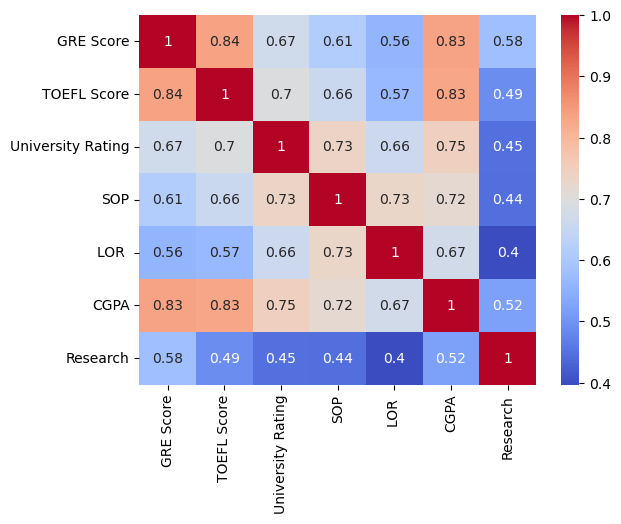

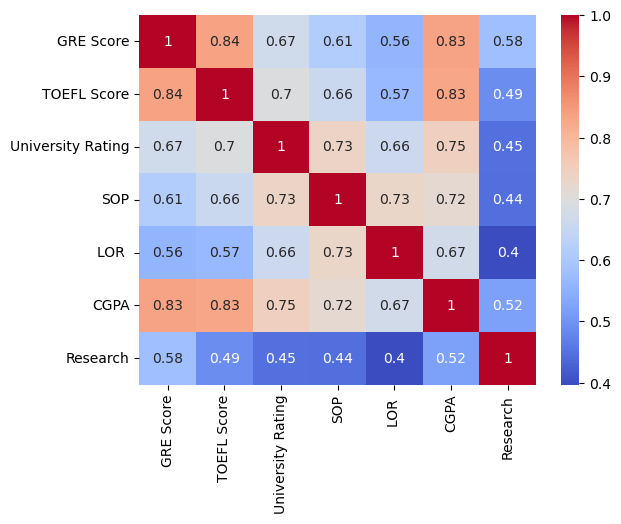

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

correlation_matrix = independent_variables.iloc[:, 1:].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

Looks like "CGPA" and "TOEFLScore" are positively corelated with GREScore.

## Split The Dataset Into Train-Test :-

In [32]:
# Convert the target variable to binary format
threshold = 0.5
y_binary = [1 if val >= threshold else 0 for val in y]

In [33]:
from sklearn.model_selection import train_test_split

# Assigning the featurs as X and trarget as y
X= df.drop(["Chance of Admit"],axis =1)
y= df["Chance of Admit"]
X_train, X_test, y_train, y_test = train_test_split(X, y_binary,test_size=0.25, random_state=7)

## Model Building

### Logistic Regression

In [34]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Create an instance of the Logistic Regression model
logreg = LogisticRegression()

# Train the model
logreg.fit(X_train, y_train)

LogisticRegression()

LogisticRegression()

In [35]:
# Make predictions
y_pred = logreg.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy
print("Logistic Regression Accuracy:", accuracy)

Logistic Regression Accuracy: 0.95
Logistic Regression Accuracy: 0.95


### Support Vector Machine

In [36]:
from sklearn.svm import SVC

# Create the Support Vector Machine model
svm = SVC()

# Train the model
svm.fit(X_train, y_train)

# Make predictions
y_pred = svm.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy
print("Support Vector Machine Accuracy:", accuracy)

Support Vector Machine Accuracy: 0.95
Support Vector Machine Accuracy: 0.95


### K Nearest Neighbour

In [37]:
from sklearn.neighbors import KNeighborsClassifier

# Create the K-Nearest Neighbors model
knn = KNeighborsClassifier()

# Train the model
knn.fit(X_train, y_train)

# Make predictions
y_pred = knn.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy
print("K-Nearest Neighbors Accuracy:", accuracy)

K-Nearest Neighbors Accuracy: 0.95
K-Nearest Neighbors Accuracy: 0.95


### Decision Tree

In [38]:
from sklearn.tree import DecisionTreeClassifier

# Create the Decision Tree model
dt = DecisionTreeClassifier()

# Train the model
dt.fit(X_train, y_train)

# Make predictions
y_pred = dt.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy
print("Decision Tree Accuracy:", accuracy)

Decision Tree Accuracy: 0.85
Decision Tree Accuracy: 0.85


### Random Forest

In [39]:
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest model
rf = RandomForestClassifier()

# Train the model
rf.fit(X_train, y_train)

# Make predictions
y_pred = rf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy
print("Random Forest Accuracy:", accuracy)

Random Forest Accuracy: 0.95
Random Forest Accuracy: 0.95


## Model Evaluation

In [40]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define a function to calculate evaluation metrics
def evaluate_model(model, X_test, y_test):
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    # Return evaluation metrics
    return accuracy, precision, recall, f1

# Evaluate Logistic Regression
logreg_accuracy, logreg_precision, logreg_recall, logreg_f1 = evaluate_model(logreg, X_test, y_test)
print("Logistic Regression:")
print("Accuracy:", logreg_accuracy)
print("Precision:", logreg_precision)
print("Recall:", logreg_recall)
print("F1-score:", logreg_f1)
print()

# Evaluate K-Nearest Neighbors
knn_accuracy, knn_precision, knn_recall, knn_f1 = evaluate_model(knn, X_test, y_test)
print("K-Nearest Neighbors:")
print("Accuracy:", knn_accuracy)
print("Precision:", knn_precision)
print("Recall:", knn_recall)
print("F1-score:", knn_f1)
print()

# Evaluate Decision Tree
dt_accuracy, dt_precision, dt_recall, dt_f1 = evaluate_model(dt, X_test, y_test)
print("Decision Tree:")
print("Accuracy:", dt_accuracy)
print("Precision:", dt_precision)
print("Recall:", dt_recall)
print("F1-score:", dt_f1)
print()

# Evaluate Random Forest
rf_accuracy, rf_precision, rf_recall, rf_f1 = evaluate_model(rf, X_test, y_test)
print("Random Forest:")
print("Accuracy:", rf_accuracy)
print("Precision:", rf_precision)
print("Recall:", rf_recall)
print("F1-score:", rf_f1)
print()

# Evaluate Support Vector Machine
svm_accuracy, svm_precision, svm_recall, svm_f1 = evaluate_model(svm, X_test, y_test)
print("Support Vector Machine:")
print("Accuracy:", svm_accuracy)
print("Precision:", svm_precision)
print("Recall:", svm_recall)
print("F1-score:", svm_f1)

Logistic Regression:
Accuracy: 0.95
Precision: 0.9025
Recall: 0.95
F1-score: 0.9256410256410257

K-Nearest Neighbors:
Accuracy: 0.95
Precision: 0.9025
Recall: 0.95
F1-score: 0.9256410256410257

Decision Tree:
Accuracy: 0.85
Precision: 0.9240033222591362
Recall: 0.85
F1-score: 0.881797034021518

Random Forest:
Accuracy: 0.95
Precision: 0.9362244897959183
Recall: 0.95
F1-score: 0.9396743153219838

Support Vector Machine:
Accuracy: 0.95
Precision: 0.9025
Recall: 0.95
F1-score: 0.9256410256410257
Logistic Regression:
Accuracy: 0.95
Precision: 0.9025
Recall: 0.95
F1-score: 0.9256410256410257

K-Nearest Neighbors:
Accuracy: 0.95
Precision: 0.9025
Recall: 0.95
F1-score: 0.9256410256410257

Decision Tree:
Accuracy: 0.85
Precision: 0.9240033222591362
Recall: 0.85
F1-score: 0.881797034021518

Random Forest:
Accuracy: 0.95
Precision: 0.9362244897959183
Recall: 0.95
F1-score: 0.9396743153219838

Support Vector Machine:
Accuracy: 0.95
Precision: 0.9025
Recall: 0.95
F1-score: 0.9256410256410257


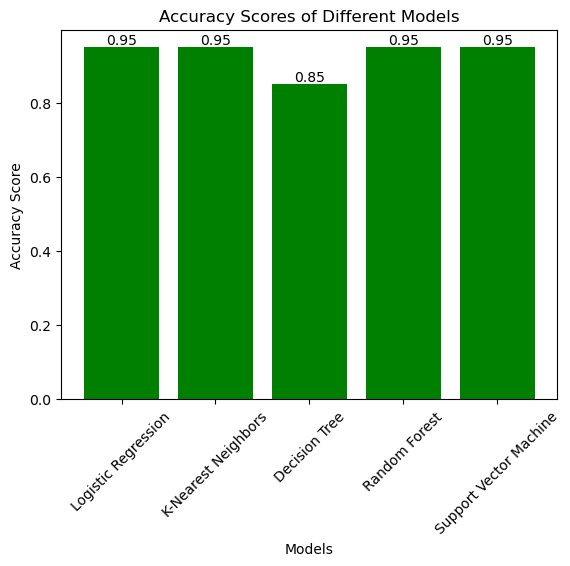

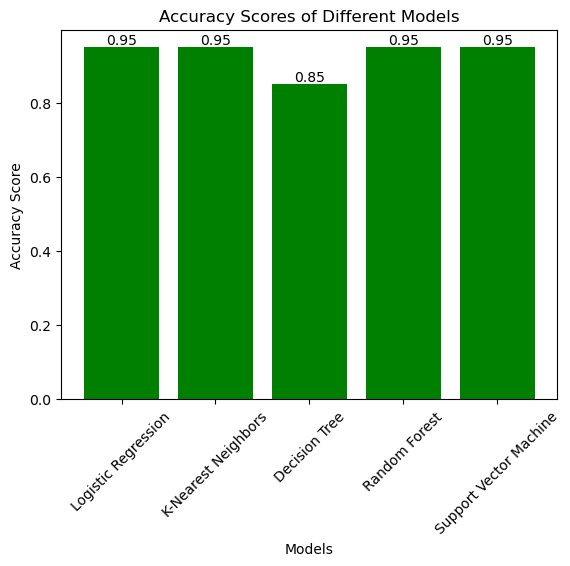

In [41]:
import matplotlib.pyplot as plt

# Define the models and their accuracy scores
models = ['Logistic Regression', 'K-Nearest Neighbors', 'Decision Tree', 'Random Forest', 'Support Vector Machine']
accuracy_scores = [logreg_accuracy, knn_accuracy, dt_accuracy, rf_accuracy, svm_accuracy]

# Plot the accuracy scores
plt.bar(models, accuracy_scores, color="green")
plt.xlabel('Models')
plt.ylabel('Accuracy Score')
plt.title('Accuracy Scores of Different Models')
plt.xticks(rotation=45)

# Add labels to the bars
for i, score in enumerate(accuracy_scores):
    plt.text(i, score, str(score), ha='center', va='bottom')

plt.show()

## Importing New Data

In [42]:
import pandas as pd

# Load the dataset into a dataframe
df_new = pd.read_csv("Admission_Predict_Ver1.1.csv")

In [43]:
print(df_new.columns)

Index(['Serial No.', 'GRE Score', 'TOEFL Score', 'University Rating', 'SOP',
       'LOR ', 'CGPA', 'Research', 'Chance of Admit '],
      dtype='object')
Index(['Serial No.', 'GRE Score', 'TOEFL Score', 'University Rating', 'SOP',
       'LOR ', 'CGPA', 'Research', 'Chance of Admit '],
      dtype='object')


In [44]:
X = df_new.drop("Chance of Admit ", axis=1)
# Drop the "Serial No." column from the new dataset
X_new = X.drop("Serial No.", axis=1)

# Use the Random Forest classifier to predict the admission
y_pred = rf.predict(X_new)

### Predicting for new data 

In [45]:
y_pred

array([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

array([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [46]:
# Create a DataFrame with the predicted values and actual values
predictions = pd.DataFrame({"Predicted": y_pred, "Actual": df_new["Chance of Admit "]})

## Actual Vs Predicted

In [47]:
# Convert the predicted values to 1 or 0
predictions["Predicted"] = predictions["Predicted"].apply(lambda x: 1 if x >= threshold else 0)

# Convert the actual values to 1 or 0
predictions["Actual"] = predictions["Actual"].apply(lambda x: 1 if x >= threshold else 0)

# Display all the predictions
pd.set_option('display.max_rows', None)
print(predictions)

     Predicted  Actual
0            0       1
1            0       1
2            1       1
3            1       1
4            0       1
5            0       1
6            1       1
7            0       1
8            1       1
9            0       0
10           1       1
11           0       1
12           1       1
13           0       1
14           1       1
15           0       1
16           1       1
17           0       1
18           0       1
19           1       1
20           1       1
21           0       1
22           1       1
23           1       1
24           0       1
25           1       1
26           1       1
27           1       0
28           1       0
29           0       1
30           1       1
31           1       1
32           1       1
33           0       1
34           1       1
35           1       1
36           1       1
37           1       1
38           1       1
39           1       0
40           1       0
41           1       0
42         